In [345]:
from visual_behavior import utilities as vbu
import visual_behavior.plotting as vbp
from visual_behavior.utilities import EyeTrackingData
from visual_behavior import database as db
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import time
import seaborn as sns
import matplotlib.patches as patches

from scipy import stats

from multiprocessing import Pool

from dro.modules import eye_tracking as et
from dro.modules import plotting as plot_utils

In [3]:
%matplotlib notebook
%widescreen

In [70]:
manifest = pd.read_csv('/allen/programs/braintv/workgroups/nc-ophys/Doug/2019.12.10.sessions_with_tracking.csv')
sessions_to_exclude = pd.read_csv('/allen/programs/braintv/workgroups/nc-ophys/visual_behavior/2019.12.10_eye_tracking_sessions_to_exclude.csv')
manifest = manifest[~manifest['ophys_session_id'].isin(sessions_to_exclude['sessions_to_exclude'].tolist())]

additional_sessions_to_exclude = [
    960475393, #mislabeled session name
]
manifest = manifest[~manifest['ophys_session_id'].isin(additional_sessions_to_exclude)]

In [5]:
eye_dict = {}
pool = Pool(16)
osids = manifest['ophys_session_id'].unique()
ans = pool.map(et.open_eye_data,osids)
eye_dict = {d.ophys_session_id:d for d in ans if d is not None}

on osid = 959751299
on osid = 957189583
on osid = 940446507
on osid = 954408500
on osid = 943299247
on osid = 961226856
on osid = 939526443
on osid = 948090163
on osid = 933439847
on osid = 937162622
on osid = 923202821
on osid = 929686773
on osid = 928146339
on osid = 927787876
on osid = 931564063
on osid = 922168593
on osid = 929255931
on osid = 928142719
on osid = 954961790
on osid = 960593969
on osid = 959454463
on osid = 948042811
on osid = 955991376
on osid = 925478114
on osid = 932664150
on osid = 935859569
on osid = 938359348
on osid = 940775208
on osid = 929255311
on osid = 952434025
on osid = 921922878
on osid = 942114744
on osid = 931687751
on osid = 958931715
on osid = 960475393
on osid = 954981981
on osid = 922743776
on osid = 947199653
on osid = 923704003
on osid = 935559843
on osid = 939524851
on osid = 927721370
on osid = 920317769
on osid = 920695792
on osid = 929688369
on osid = 918719819
on osid = 918889065
on osid = 932662051
on osid = 915587736
on osid = 914728054


In [6]:
pool = Pool(16)
bd = pool.map(et.open_behavior_data,list(eye_dict.keys()))
behavior_dict = {d.ophys_session_id:d for d in bd if d is not None}

on osid = 961226856
on osid = 948090163
on osid = 940446507
on osid = 954408500
on osid = 959751299
on osid = 957189583
on osid = 937162622
on osid = 943299247
on osid = 933439847
on osid = 929686773
on osid = 939526443
on osid = 928146339
on osid = 927787876
on osid = 923202821
on osid = 931564063
on osid = 922168593
on osid = 940775208
on osid = 928142719
on osid = 954961790
on osid = 931687751
on osid = 955991376
on osid = 948042811
on osid = 959454463
on osid = 960593969
on osid = 942114744
on osid = 922743776
on osid = 921922878
on osid = 938359348
on osid = 925478114
on osid = 932664150
on osid = 929255931
on osid = 935859569
on osid = 927721370
on osid = 958931715
on osid = 947199653
on osid = 939524851
on osid = 952434025
on osid = 929688369
on osid = 954981981
on osid = 941300832
on osid = 960475393
on osid = 922511481
on osid = 938140092
on osid = 920317769
on osid = 923704003
on osid = 935559843
on osid = 932662051
on osid = 929255311
on osid = 920695792
on osid = 918719819


In [7]:
with Pool(16) as pool:
    rd = pool.map(et.get_response_data,np.sort(list(behavior_dict.keys())))
response_dict = {d['ophys_session_id']:d for d in rd if d is not None}

on osid = 799195371
on osid = 805269503
on osid = 794706889
on osid = 815485890
on osid = 798007990
on osid = 806812738
on osid = 807393193
on osid = 775289198
on osid = 809393834
on osid = 824745199
on osid = 808340530
on osid = 830272668
on osid = 837363020
on osid = 840490733
on osid = 835795999
on osid = 842364341
on osid = 806812738
on osid = 840490733
on osid = 808340530
on osid = 824745199
on osid = 815485890
on osid = 794706889
on osid = 837363020
on osid = 842364341
on osid = 830272668
on osid = 799195371
on osid = 807393193
on osid = 835795999
on osid = 798007990
on osid = 775289198
on osid = 805269503
on osid = 805643175
on osid = 841303580
on osid = 842583486
on osid = 825682242
on osid = 807055274
on osid = 835796136
on osid = 798818118
on osid = 833002992
on osid = 803223329
on osid = 795217244
on osid = 839208243
on osid = 808387448
on osid = 819949602
on osid = 789220000
on osid = 807667681
on osid = 809393834
on osid = 805643175
on osid = 825682242
on osid = 835796136


## get averages around the omission

In [26]:
df_omitted_means = pd.DataFrame()

for ids,session in manifest.iterrows():
    df = response_dict[session['ophys_session_id']]['pupil_area']['omitted_stim']
    
    if 't' in df.columns:
        time_parameter = 't'
    elif 'time' in df.columns:
        time_parameter = 'time'
        
    cols = [col for col in df.columns if col is not 'time_parameter']
    mean_response = et.subtract_mean(df)[cols].mean(axis=1)
    
    if len(df_omitted_means) == 0:
        df_omitted_means['time'] = df[time_parameter]
    
    df_omitted_means[session['ophys_session_id']] = mean_response


<IPython.core.display.Javascript object>


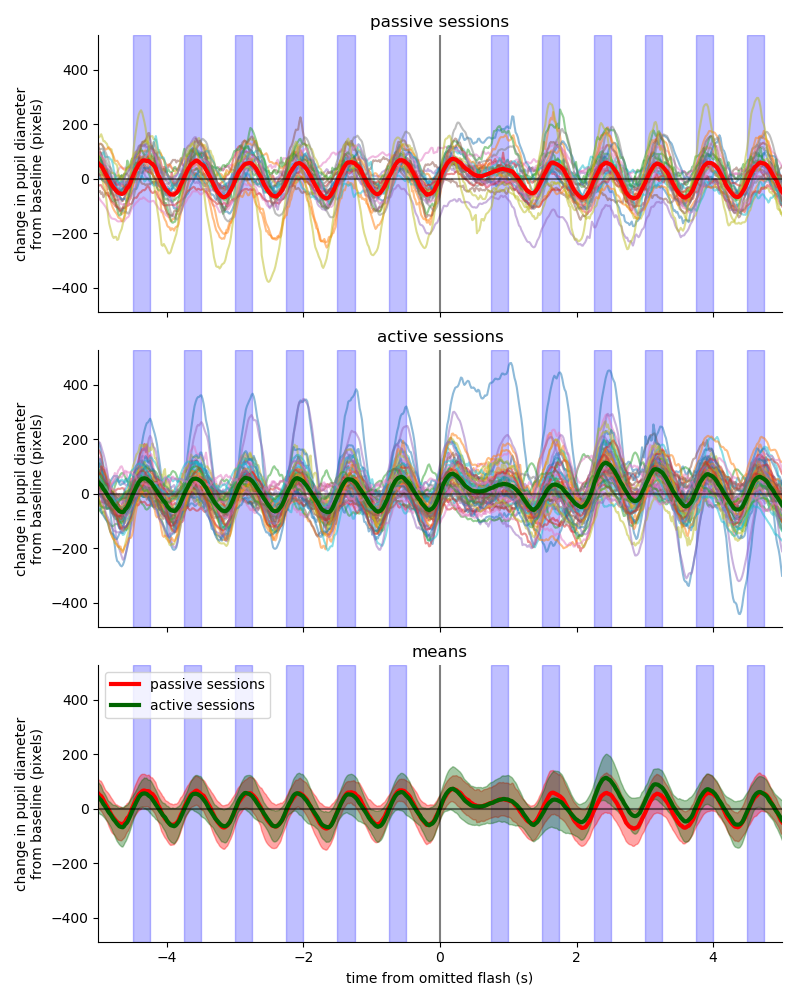

In [64]:
passive_sessions = manifest[(manifest['stage_name'].str.contains('passive'))&(manifest['project_code']=='VisualBehavior')]
active_sessions = manifest[(~manifest['stage_name'].str.contains('passive'))&(manifest['project_code']=='VisualBehavior')]

fig,ax=plt.subplots(3,1,figsize=(8,10),sharex=True,sharey=True)
for osid in passive_sessions['ophys_session_id'].unique():
    ax[0].plot(df_omitted_means['time'],df_omitted_means[osid],alpha=0.5)
for osid in active_sessions['ophys_session_id'].unique():
    ax[1].plot(df_omitted_means['time'],df_omitted_means[osid],alpha=0.5)
    
for ii in [0,2]:
    ax[ii].plot(df_omitted_means['time'],df_omitted_means[passive_sessions['ophys_session_id'].unique()].mean(axis=1),alpha=1,linewidth=3,color='red')
for ii in [1,2]:
    ax[ii].plot(df_omitted_means['time'],df_omitted_means[active_sessions['ophys_session_id'].unique()].mean(axis=1),alpha=1,linewidth=3,color='darkgreen')

for sessions,color in zip([passive_sessions,active_sessions],['red','darkgreen']):
    cols = sessions['ophys_session_id'].unique()
    ax[2].fill_between(
        df_omitted_means['time'], 
        df_omitted_means[cols].mean(axis=1) + df_omitted_means[cols].std(axis=1), 
        df_omitted_means[cols].mean(axis=1) - df_omitted_means[cols].std(axis=1), 
        color=color, 
        alpha=0.35
    )
    
ax[0].set_title('passive sessions')
ax[1].set_title('active sessions')
ax[2].set_title('means')
ax[2].legend(['passive sessions','active sessions'])

ax[0].set_xlim(-5,5)
for ii in range(3):
    ax[ii].axvline(0,color='black',alpha=0.5)
    ax[ii].axhline(0,color='black',alpha=0.5)
    et.designate_flashes(ax[ii],omit=0)
    ax[ii].set_ylabel("change in pupil diameter\nfrom baseline (pixels)")
ax[2].set_xlabel('time from omitted flash (s)')

sns.despine()
fig.tight_layout()


<IPython.core.display.Javascript object>


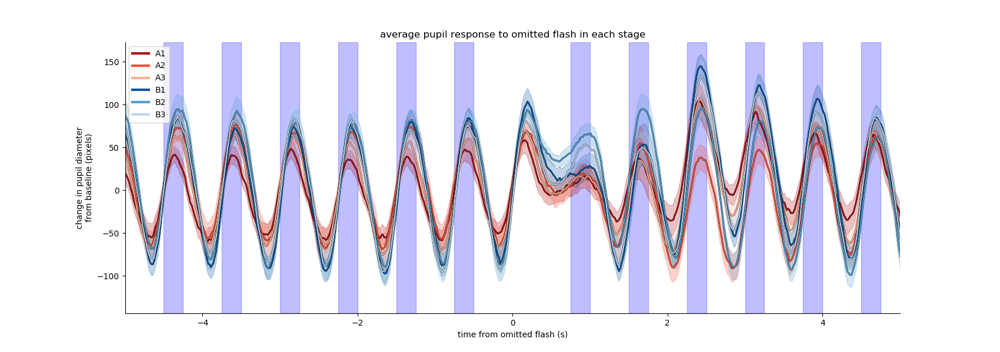

In [357]:
fig,ax=plt.subplots(figsize=(17,6))
stage_names = np.sort(manifest[manifest['project_code']=='VisualBehavior']['stage_name'].unique())
                        
plot_utils.initialize_legend(ax,[et.get_session_color(et.get_session_name(stage_name)) for stage_name in stage_names],linewidth=3)

for stage_name in stage_names:

    sessions = manifest.query('stage_name == @stage_name')
    session_name = et.get_session_name(stage_name)
    cols = sessions['ophys_session_id'].unique()
    for lt,color in zip([2,1.5],['black',et.get_session_color(session_name)]):
        ax.plot(
            df_omitted_means['time'],
            df_omitted_means[cols].mean(axis=1),
            alpha=1,
            linewidth=lt,
            color=color
        )
    ax.fill_between(
        df_omitted_means['time'], 
        df_omitted_means[cols].mean(axis=1) + df_omitted_means[cols].std(axis=1)/np.sqrt(len(cols)), 
        df_omitted_means[cols].mean(axis=1) - df_omitted_means[cols].std(axis=1)/np.sqrt(len(cols)), 
        color=et.get_session_color(session_name), 
        alpha=0.25
    )
ax.set_xlim(-5,5)
    
ax.legend([et.get_session_name(stage_name) for stage_name in stage_names])

sns.despine()

ax.set_title('average pupil response to omitted flash in each stage')
ax.set_ylabel("change in pupil diameter\nfrom baseline (pixels)")
ax.set_xlabel('time from omitted flash (s)')

et.designate_flashes(ax,omit=0)

<IPython.core.display.Javascript object>


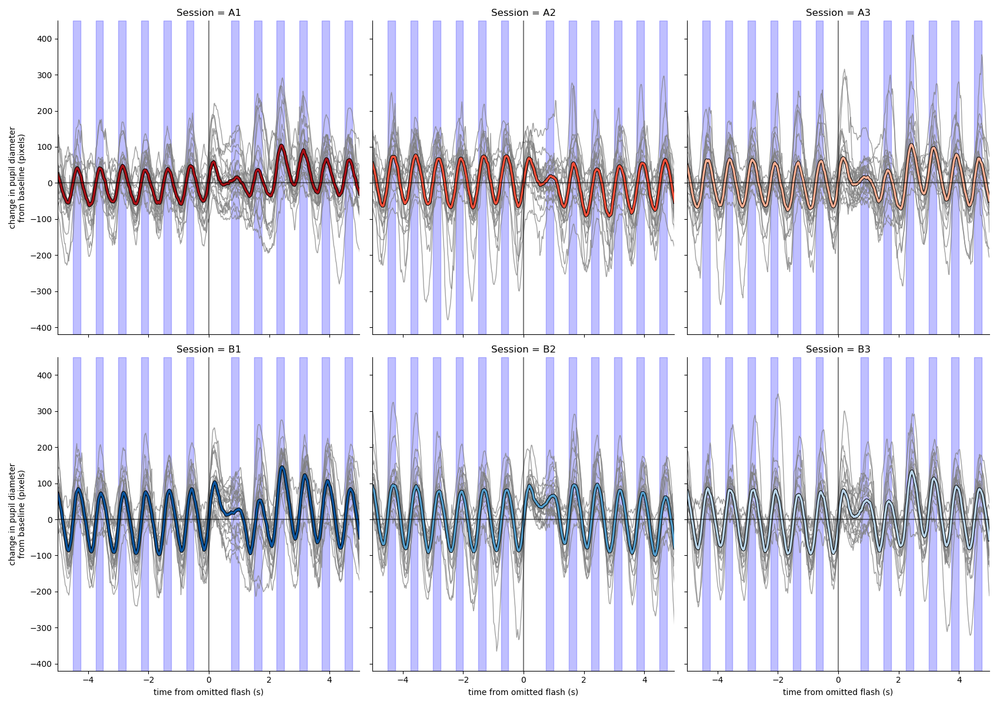

In [132]:
fig,axes=plt.subplots(2,3,sharex=True,sharey=True,figsize=(17,12))
for ii,ax in enumerate(axes.flatten()):
    stage_name = stage_names[ii]
    sessions = manifest.query('stage_name == @stage_name')
    session_name = et.get_session_name(stage_name)
    cols = sessions['ophys_session_id'].unique()
    
    for col in cols:
        ax.plot(
            df_omitted_means['time'],
            df_omitted_means[col],
            alpha=0.75,
            linewidth=1,
            color='gray', #et.get_session_color(session_name)
        )
    
    for lt,color in zip([4,2.5],['black',et.get_session_color(session_name)]):
        ax.plot(
            df_omitted_means['time'],
            df_omitted_means[cols].mean(axis=1),
            alpha=1,
            linewidth=lt,
            color=color
        )
    ax.set_title('Session = {}'.format(session_name))
    
    ax.axvline(0,color='black',alpha=0.5)
    ax.axhline(0,color='black',alpha=0.5)
    
    ax.set_xlim(-5,5)
    et.designate_flashes(ax,omit=0)

for ii in [0,3]:
    axes.flatten()[ii].set_ylabel("change in pupil diameter\nfrom baseline (pixels)")
for ii in [3,4,5]:
    axes.flatten()[ii].set_xlabel('time from omitted flash (s)')
    
fig.tight_layout()
sns.despine()

## get mean pupil diameter early in each session

In [202]:
sessions = manifest[(manifest['project_code']=='VisualBehavior')]
early_session_means = []
for _,session in sessions.iterrows():
    osid = session['ophys_session_id']
    df = eye_dict[osid].ellipse_fits['pupil'].rename(columns={'t':'time'})
    
    early_session_means.append({
        'ophys_session_id':osid,
        'first_10_minute_mean':df.query('time > 300 and time < 900')['blink_corrected_area'].mean(),
        'stage_name':et.get_session_name(session['stage_name']),
        'donor_id':session['donor_id'],
    })
early_session_means = pd.DataFrame(early_session_means)

In [203]:
early_session_means

,donor_id,first_10_minute_mean,ophys_session_id,stage_name
0,882757043,4586.387608,961226856,A2
1,875479693,4415.347628,952434025,B3
2,875479693,3378.461856,948090163,A3
3,854625254,7470.702816,943299247,B3
4,854625254,7195.129991,942114744,B2
5,854625254,6873.530136,941300832,B1
6,854625254,5495.010931,940446507,A3
7,875479693,4709.833652,939524851,A1
8,847074139,4647.668183,898295293,B2
9,847076515,6829.881854,894204946,B3


<IPython.core.display.Javascript object>


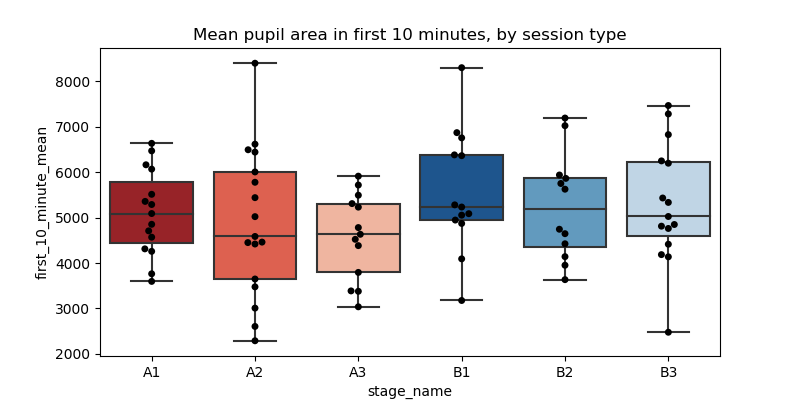

['black', 'black', 'black', 'black', 'black', 'black']
[(0.6663437139561708, 0.06339100346020761, 0.08641291810841982), (0.9570011534025374, 0.3087120338331411, 0.22191464821222606), (0.9882352941176471, 0.6866743560169165, 0.5778854286812765), (0.044059976931949255, 0.3338869665513264, 0.6244521337946944), (0.3262898885044214, 0.6186236063052672, 0.802798923490965), (0.7309496347558632, 0.8394771241830065, 0.9213225682429834)]


Text(0.5, 1.0, 'Mean pupil area in first 10 minutes, by session type')

In [183]:
fig,ax=plt.subplots(figsize=(8,4))

for plot,palette,alpha in zip([sns.swarmplot,sns.boxplot],[['black']*6,et.get_colors_for_session_numbers()],[1,0.5]):
    print(palette)
    plot(
        x='stage_name',
        y='first_10_minute_mean',
        data=early_session_means,
        order = np.sort(early_session_means['stage_name'].unique()),
        ax=ax,
        palette=palette,

    )
ax.set_title('Mean pupil area in first 10 minutes, by session type')

<IPython.core.display.Javascript object>


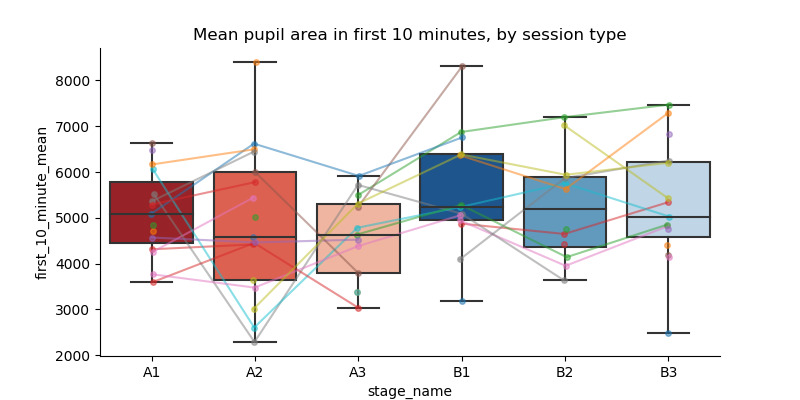

In [229]:
session_names = np.sort(early_session_means['stage_name'].unique())

fig,ax=plt.subplots(figsize=(8,4))
sns.boxplot(
    x='stage_name',
    y='first_10_minute_mean',
    data=early_session_means,
    order = np.sort(early_session_means['stage_name'].unique()),
    ax=ax,
    palette=et.get_colors_for_session_numbers(),
    )
ax.set_title('Mean pupil area in first 10 minutes, by session type')

for donor_id in early_session_means.donor_id.unique():
    df = early_session_means.query('donor_id == @donor_id')
    
    ax.plot(
        np.arange(6)+0.01*np.random.randn(6),
        [df.query('stage_name==@s')['first_10_minute_mean'].iloc[0] if len(df.query('stage_name==@s'))>0 else np.nan for s in session_names],
        marker='o',
        markersize=4,
        alpha=0.5
    )
sns.despine()

## look at an example in time

<IPython.core.display.Javascript object>


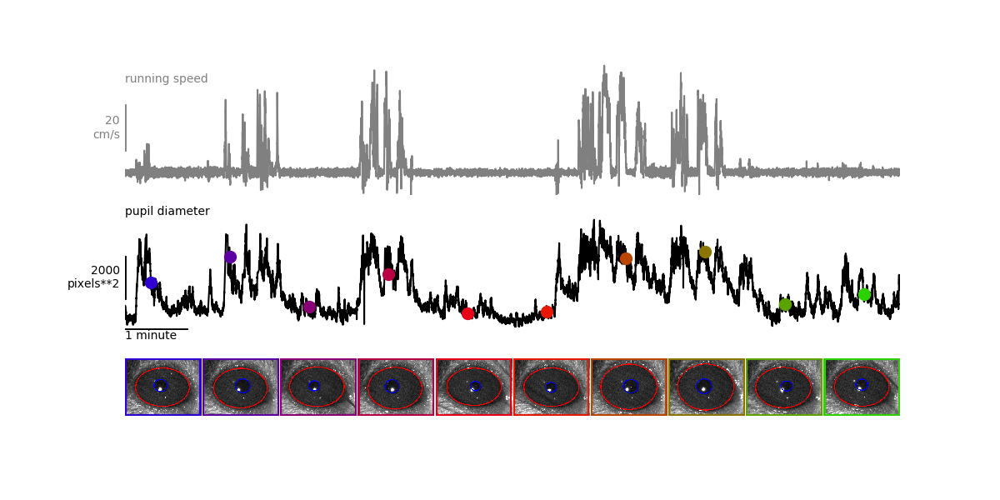

In [356]:
# fig,ax=plt.subplots(2,1,sharex=True,figsize=(12,6))
fig=plt.figure(figsize=(12,6))
ax = [
    vbp.placeAxesOnGrid(fig,xspan=(0,1),yspan=(0,0.35)),
    vbp.placeAxesOnGrid(fig,xspan=(0,1),yspan=(0.35,0.7))
]
N = 10
ax_frames = [vbp.placeAxesOnGrid(fig,xspan=(n*1/N,(n+1)*1/N),yspan=(0.7,1)) for n in range(10)]

osid = manifest.sample(random_state=6)['ophys_session_id'].iloc[0]

bd = behavior_dict[osid]
ed = eye_dict[osid]
ax[0].plot(
    bd.running['time'],
    bd.running['speed'],
    color='gray'
)

dfp = ed.ellipse_fits['pupil'].rename(columns={'t':'time'})
ax[1].plot(
    dfp['time'],
    dfp['blink_corrected_area'],
    color='black'
)

ax[0].set_ylabel('running_speed (cm/s)')
ax[1].set_ylabel('pupil diameter (pixels**2)')
ax[1].set_xlabel('session time')

for axis in ax:
    axis.axis('off')

ax[0].set_xlim(1300,2050)
ax[1].set_xlim(1300,2050)

plt.subplots_adjust(hspace=-0.1)

ax[0].set_ylim(-10,50)
ax[1].set_ylim(1500,8000)

ax[0].text(1300,40,'running speed',color='gray')
ax[1].text(1300,7000,'pupil diameter',color='black')

ax[1].plot([1300,1360],[1520,1520],linewidth=2,color='black')
ax[1].text(1300,1490,'1 minute',va='top')


ax[1].plot([1300,1300],[3000,5000],linewidth=2,color='black')
ax[1].text(1295,4000,'2000\npixels**2',va='center',ha='right')

ax[0].plot([1300,1300],[10,30],linewidth=2,color='gray')
ax[0].text(1295,20,'20\ncm/s',va='center',ha='right',color='gray')

palette = sns.color_palette("brg", 10)
for ii,t in enumerate(np.linspace(1325,2015,10)):
    rect = patches.Rectangle((0,0),399,299,linewidth=3,edgecolor=palette[ii],facecolor='none')
    
    ax_frames[ii].imshow(ed.get_annotated_frame(time=t)[125:425,100:500])
    ax_frames[ii].axis('off')
    ax_frames[ii].add_patch(rect)
    
    idx = np.abs(dfp['time'] - t).argmin()
    ax[1].plot(
        dfp.loc[idx]['time'],
        dfp.loc[idx]['blink_corrected_area'],
        marker='o',
        markersize=10,
        color=palette[ii],
    )
    


In [558]:
## look at pupil preceding first flashes and following last
ed = eye_dict[osid]
bd = behavior_dict[osid]

In [612]:
first_stim_df = pd.DataFrame()
last_stim_df = pd.DataFrame()

duration = 10

for osid in behavior_dict.keys():
    ed = eye_dict[osid]
    bd = behavior_dict[osid]
    
    vs = bd.visual_stimuli[bd.visual_stimuli['image_name'].str.startswith('im')]
    first_stim = vs.iloc[0]['time']
    last_stim = vs.iloc[-1]['time']
    
    df = ed.ellipse_fits['pupil']
    if 'time' in df.columns:
        t = 'time'
    else:
        t = 't'
        
    if df.index.name == 't' or df.index.name == 'time':
        pass
    else:
        df.set_index(t,inplace=True)
    
    new_t = np.arange(-duration,duration,1/60.)
    if len(first_stim_df) == 0:
        first_stim_df['time'] = new_t
        last_stim_df['time'] = new_t
        
    first_stim_df[osid] = np.interp(
        new_t, 
        df.loc[first_stim-duration:first_stim+duration].index.values - first_stim, 
        df.loc[first_stim-duration:first_stim+duration]['blink_corrected_area'].values
    )
    last_stim_df[osid] = np.interp(
        new_t, 
        df.loc[last_stim-duration:last_stim+duration].index.values - last_stim, 
        df.loc[last_stim-duration:last_stim+duration]['blink_corrected_area'].values
    )
    

<IPython.core.display.Javascript object>


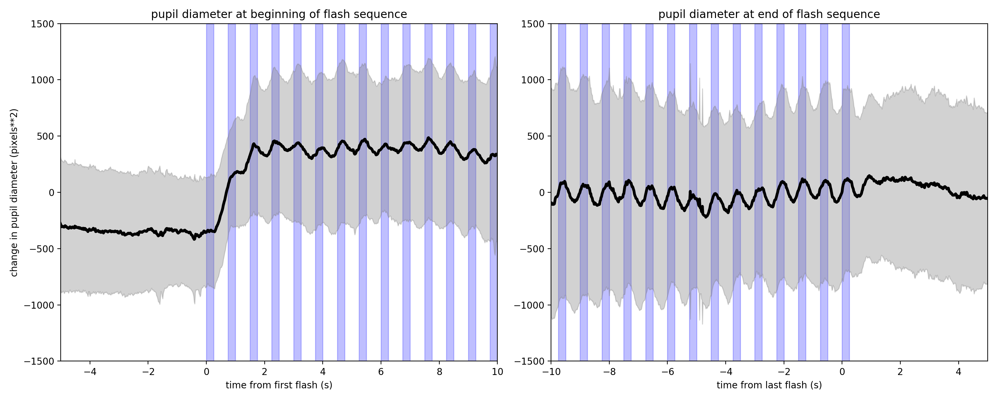

In [627]:
cols = [c for c in first_stim_df.columns if c != 'time']

fig,ax = plt.subplots(1,2,figsize=(15,6))

for ii,df in enumerate([first_stim_df,last_stim_df]):
    et.plot_event_triggered_response(
        df, 
        ax=ax[ii], 
        title='', 
        mean_subtract = True, 
        time_zero_subtract = False, 
        fg_color='black',
        bg_color='gray', 
        show_traces=False
    )


et.designate_flashes(ax[0],pre_color='white',post_color='blue')
et.designate_flashes(ax[1],pre_color='blue',post_color='white')
ax[1].axvspan(0,0.25,color='blue',alpha=0.25,zorder=-np.inf)
ax[0].set_xlim(-5,10)
ax[1].set_xlim(-10,5)
for axis in ax:
    axis.set_ylim(-1500,1500)
    
ax[0].set_title('pupil diameter at beginning of flash sequence')
ax[1].set_title('pupil diameter at end of flash sequence')
ax[0].set_xlabel('time from first flash (s)')
ax[1].set_xlabel('time from last flash (s)')
ax[0].set_ylabel('change in pupil diameter (pixels**2)')
fig.tight_layout()

## plot pupil for each individual image

In [429]:
def make_image_response_plot(osid):
    ed = et.open_eye_data(osid)
    bd = et.open_behavior_data(osid)
    pupil_responses,running_responses = et.get_individual_image_responses(ed,bd)
    fig,ax = et.plot_individual_image_responses(pupil_responses,running_responses)
    return fig,ax

on osid = 913564409
on osid = 913564409


<IPython.core.display.Javascript object>


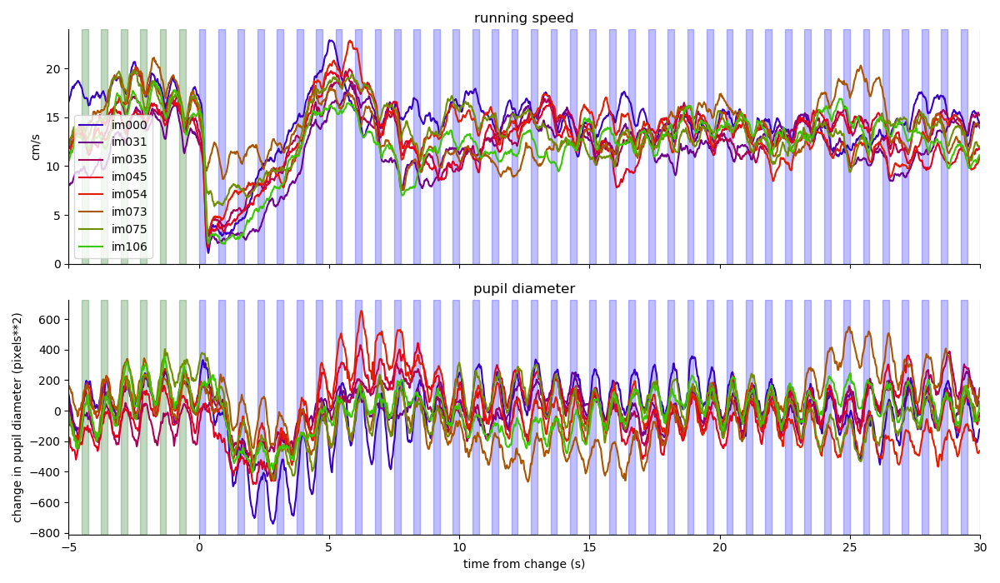

In [431]:
make_image_response_plot(osid);

In [535]:
ed = et.open_eye_data(osid)
bd = et.open_behavior_data(osid)
pupil_responses,running_responses = et.get_individual_image_responses(ed,bd)
    

on osid = 913564409
on osid = 913564409


In [543]:
fig = plot_utils.plotly_event_triggered_response_plot(
    pupil_responses['im000'],
    x_value='time',
    y_values=[c for c in pupil_responses['im000'] if c!='time'],
    var_name='event_number', 
    value_name='pupil_diameter'
)
fig.show()

In [540]:
first_times = bd.visual_stimuli.query('image_name == "im000" and consecutive_flashes == 0')['time']
first_times.iloc[32]

3510.92224

In [541]:
osid

913564409

In [466]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.fftpack

def plotFFT(t,y,sampling_rate,ax=None):
   
    if ax is None:
        fig,ax = plt.subplots()
        
    N = np.max(t)*sampling_rate
    yf = scipy.fftpack.fft(y)
    tf = np.linspace(0.0, sampling_rate/(2.0), N/2)
    
    ax.plot(tf, 2.0/N * np.abs(yf[0:int(N/2)]))

In [476]:
# Number of samplepoints

# sample spacing
sampling_rate = 60 #Hz
T_final = 20 #seconds
N = T_final*sampling_rate
t = np.linspace(0.0, T_final, N)

mode1 = 5
mode2 = 20
y = np.sin(mode1*2.0*np.pi*t) + 0.5*np.sin(mode2*2.0*np.pi*t) + np.random.randn(len(t)) + 2

<IPython.core.display.Javascript object>


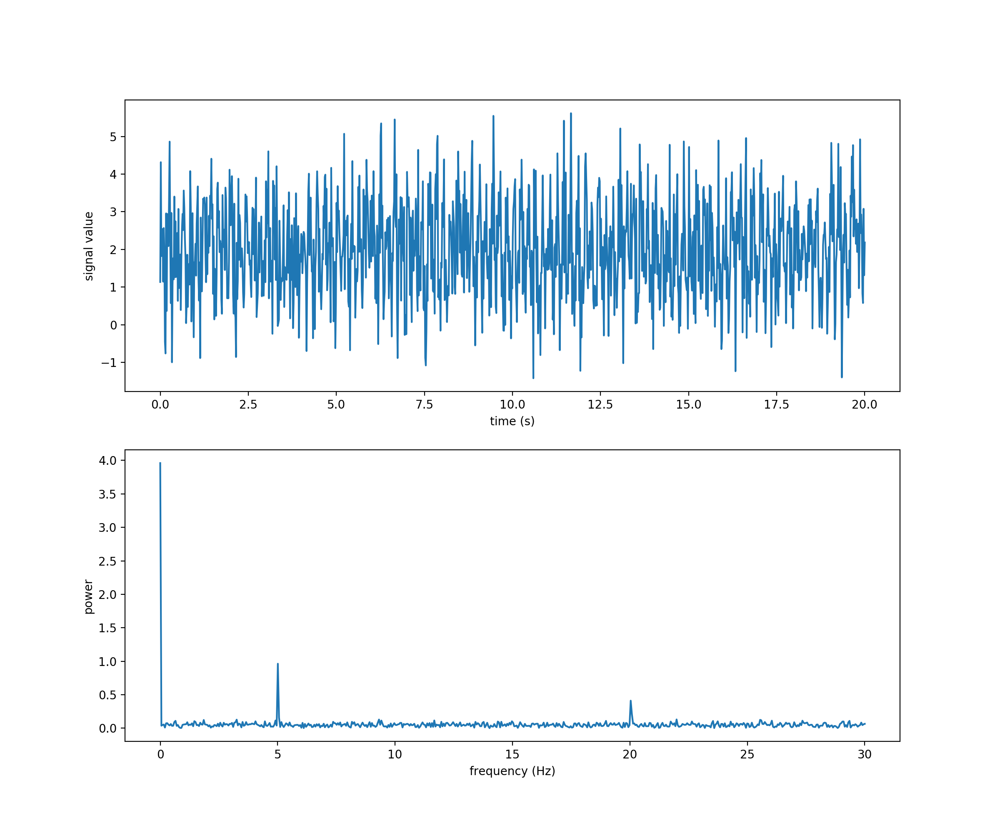

Text(0, 0.5, 'signal value')

In [477]:
fig, ax = plt.subplots(2,1,figsize=(12,10))
ax[0].plot(t,y)
plotFFT(t,y,sampling_rate,ax=ax[1])

ax[1].set_xlabel('frequency (Hz)')
ax[1].set_ylabel('power')

ax[0].set_xlabel('time (s)')
ax[0].set_ylabel('signal value')

In [495]:
fig, ax = plt.subplots(2,1,figsize=(12,7))

df = pupil_responses['im000']
cols = [c for c in df.columns if c!='time']

t = df['time'].values - df['time'].values.min()

for col in cols:
    
    y = df[col].values

    ax[0].plot(t,y)
    plotFFT(
        t,
        y-np.mean(y),
        sampling_rate=60,
        ax=ax[1]
    )

ax[1].set_xlabel('frequency (Hz)')
ax[1].set_ylabel('power')

et.designate_flashes(ax[0])

ax[0].set_xlabel('time (s)')
ax[0].set_ylabel('signal value')

ax[1].set_xlim(-0.25,5)

fig.tight_layout()

<IPython.core.display.Javascript object>

In [490]:
1/1.57

0.6369426751592356

In [493]:
1/1.88

0.5319148936170213

In [486]:
9.2-8.6

0.5999999999999996

In [487]:
12.2 - 11.55

0.6499999999999986

In [498]:
import plotly.express as px


In [507]:
df = pupil_responses['im000']
df

,time,event_0,event_1,event_2,event_3,event_4,event_5,event_6,event_7,event_8,event_9,event_10,event_11,event_12,event_13,event_14,event_15,event_16,event_17,event_18,event_19,event_20,event_21,event_22,event_23,event_24,event_25,event_26,event_27,event_28,event_29,event_30,event_31,event_32,event_33,event_34
0,-5.000000,3251.692138,5679.360584,6273.424538,6313.670147,4803.846292,5491.161057,5895.872629,5748.887695,5494.571805,6657.608674,7024.329117,6344.319266,5971.089551,4815.656616,4855.688540,4501.883429,6281.847061,3225.105678,3570.428942,7627.916985,5171.813813,5853.652197,6291.506504,6515.097775,7162.980415,7629.100316,5456.251225,7811.284351,8008.523743,8314.669425,7784.043534,7683.916024,7847.152200,4491.419079,2872.494009
1,-4.983333,3275.186310,5677.304405,6273.424538,6269.437038,4768.975998,5467.216737,5895.872629,5748.887695,5494.295339,6625.932796,7024.329117,6297.857911,5908.612596,4799.514940,4848.508217,4501.883429,6281.453191,3225.105678,3570.428942,7627.441082,5171.813813,5828.598803,6291.506504,6529.226531,7162.980415,7609.946041,5456.251225,7777.906334,8008.523743,8255.241898,7784.043534,7683.916024,7871.846392,4489.355228,2872.494009
2,-4.966667,3340.484175,5659.609230,6272.449777,6197.066113,4733.852818,5362.929630,5819.048179,5737.673025,5491.786576,6593.636835,6963.558619,6233.148504,5840.450960,4774.780529,4789.166699,4508.236421,6278.875512,3232.133804,3584.359997,7590.833114,5172.063415,5733.627633,6292.650018,6558.784598,7162.980415,7580.649200,5481.261649,7717.873928,8004.818975,8190.791128,7765.391784,7505.052183,7960.229326,4485.694620,2892.370416
3,-4.950000,3433.758512,5637.540948,6269.386414,6168.612454,4733.323392,5308.181689,5711.118353,5648.808759,5489.277812,6569.932217,6867.766534,6131.376874,5767.906920,4796.786197,4732.511482,4555.860053,6276.297832,3241.325703,3652.582595,7553.748065,5201.086815,5658.933464,6295.238326,6567.979982,7090.431735,7613.800926,5534.611531,7704.366460,7999.958350,8120.409580,7745.532596,7293.679172,7968.264924,4400.718582,2923.820427
4,-4.933333,3544.859375,5582.276116,6263.145587,6167.443321,4732.911987,5360.268210,5651.939397,5577.564149,5535.615672,6550.152781,6844.319982,6016.283805,5693.513196,4842.805766,4676.574655,4458.023027,6214.004143,3278.051605,3705.997822,7488.742436,5215.603969,5852.808448,6296.685921,6565.491019,7009.335515,7678.780302,5568.973144,7727.712078,8056.925800,8050.028032,7745.897673,7256.930018,7929.957009,4247.636015,2935.759616
5,-4.916667,3586.413218,5523.198965,6250.140218,6166.274189,4735.158933,5412.354731,5599.521834,5624.235691,5595.458993,6515.101752,6900.068604,6072.716846,5707.207140,4724.714898,4645.825629,4336.309454,6150.580900,3345.356638,3699.360100,7424.556590,5214.049278,5992.745803,6260.995283,6549.946264,6928.525377,7709.730794,5581.258431,7751.057697,8163.386879,7962.318875,7747.594939,7252.163559,7784.337008,4354.400816,2936.723966
6,-4.900000,3585.341469,5433.086612,6248.801760,6209.764659,4739.566874,5374.388055,5611.346142,5670.907234,5558.631889,6473.118780,6903.470378,6226.220881,5731.855093,4521.478031,4639.373676,4344.802156,6107.107051,3348.894905,3700.593346,7407.773488,5177.798492,5941.894697,6186.321632,6526.916406,6851.056622,7677.816990,5584.677377,7757.061537,8213.707263,7789.285621,7879.233571,7206.014864,7578.144102,4469.589328,2916.217785
7,-4.883333,3581.964561,5342.974259,6272.415698,6246.335374,4763.316517,5267.980906,5632.465518,5638.212379,5512.240443,6471.553101,6875.410407,6209.121789,5734.609809,4326.912901,4650.937296,4409.523683,6063.633202,3334.698448,3730.496795,7391.419930,5076.713981,5894.682133,6062.474020,6534.648000,6797.221184,7627.666413,5566.494141,7714.121008,8245.967054,7815.395068,8019.048784,7152.089180,7511.541906,4422.530548,2883.295565
8,-4.866667,3567.348991,5361.694994,6294.072037,6276.816955,4787.360705,5269.629770,5665.987332,5587.003261,5423.559623,6470.552986,6809.863450,6132.330027,5735.215111,4552.969895,4823.566592,4380.944113,6045.811822,3343.839826,3760.